### imports

In [23]:
import os
import pandas as pd
import folium
from folium.plugins import MarkerCluster
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from zlib import crc32
import random
import seaborn as sns

from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

### 1. Fetch data

In [2]:
"""
Fetch .csv data from directories.
"""

csv_path = os.path.join('data')
all_files = os.listdir(csv_path)
csv_files = [f for f in all_files if f.count('rent') == 0 and f.count('.csv') == 1] # if you want rent-apartments, set 1 instad 0
df_list = []

for csv in csv_files:
    file_path = os.path.join(csv_path, csv)
    try:
        # Try reading the file using default UTF-8 encoding
        df = pd.read_csv(file_path)
        df_list.append(df)
    except Exception as e:
        print(f"Could not read file {csv}, error: {e}")

data = pd.concat(df_list, ignore_index=True)

print(f"Samples amount: {len(data)}")
data.head()

Samples amount: 134577


,id,city,type,squareMeters,rooms,floor,floorCount,buildYear,latitude,longitude,...,pharmacyDistance,ownership,buildingMaterial,condition,hasParkingSpace,hasBalcony,hasElevator,hasSecurity,hasStorageRoom,price
0,f8524536d4b09a0c8ccc0197ec9d7bde,szczecin,blockOfFlats,63.00,3.0,4.0,10.0,1980.0,53.378933,14.625296,...,0.413,condominium,concreteSlab,NaN,yes,yes,yes,no,yes,415000
1,accbe77d4b360fea9735f138a50608dd,szczecin,blockOfFlats,36.00,2.0,8.0,10.0,NaN,53.442692,14.559690,...,0.205,cooperative,concreteSlab,NaN,no,yes,yes,no,yes,395995
2,8373aa373dbc3fe7ca3b7434166b8766,szczecin,tenement,73.02,3.0,2.0,3.0,NaN,53.452222,14.553333,...,0.280,condominium,brick,NaN,no,no,no,no,no,565000
3,0a68cd14c44ec5140143ece75d739535,szczecin,tenement,87.60,3.0,2.0,3.0,NaN,53.435100,14.532900,...,0.087,condominium,brick,NaN,yes,yes,no,no,yes,640000
4,f66320e153c2441edc0fe293b54c8aeb,szczecin,blockOfFlats,66.00,3.0,1.0,3.0,NaN,53.410278,14.503611,...,0.514,condominium,NaN,NaN,no,no,no,no,no,759000


### 2. Data cleaning

In [3]:
"""
Check data type.
"""

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134577 entries, 0 to 134576
Data columns (total 28 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    134577 non-null  object 
 1   city                  134577 non-null  object 
 2   type                  104834 non-null  object 
 3   squareMeters          134577 non-null  float64
 4   rooms                 134577 non-null  float64
 5   floor                 110315 non-null  float64
 6   floorCount            132816 non-null  float64
 7   buildYear             112014 non-null  float64
 8   latitude              134577 non-null  float64
 9   longitude             134577 non-null  float64
 10  centreDistance        134577 non-null  float64
 11  poiCount              134577 non-null  float64
 12  schoolDistance        134438 non-null  float64
 13  clinicDistance        134029 non-null  float64
 14  postOfficeDistance    134388 non-null  float64
 15  

In [4]:
"""
Clean NaN and duplicates. Drop columns with lack of data.
"""

dropped_columns = ['id','type', 'floor', 'buildYear', 'condition', 'buildingMaterial']
data.drop(dropped_columns, axis=1, inplace=True)
data.dropna(inplace=True)
data = data.drop_duplicates().reset_index(drop=True)

In [5]:
"""
Check number of null values.
"""

print(f"Dataset amount: {len(data)}")
data.isna().sum()

Dataset amount: 66443


city                    0
squareMeters            0
rooms                   0
floorCount              0
latitude                0
longitude               0
centreDistance          0
poiCount                0
schoolDistance          0
clinicDistance          0
postOfficeDistance      0
kindergartenDistance    0
restaurantDistance      0
collegeDistance         0
pharmacyDistance        0
ownership               0
hasParkingSpace         0
hasBalcony              0
hasElevator             0
hasSecurity             0
hasStorageRoom          0
price                   0
dtype: int64

### 3. Analize cleared data

In [6]:
"""
Statistics.
"""

data.describe()

,squareMeters,rooms,floorCount,latitude,longitude,centreDistance,poiCount,schoolDistance,clinicDistance,postOfficeDistance,kindergartenDistance,restaurantDistance,collegeDistance,pharmacyDistance,price
count,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,66443.000000,6.644300e+04
mean,57.114249,2.626432,5.487967,51.975536,19.555433,4.416842,19.964090,0.390295,0.944420,0.489531,0.336887,0.323454,1.487795,0.334055,7.555741e+05
std,20.470559,0.890118,3.368798,1.307263,1.751306,2.765013,22.605896,0.381339,0.840503,0.410129,0.349058,0.369218,1.112050,0.364922,3.876505e+05
min,25.000000,1.000000,1.000000,49.982200,14.462282,0.020000,0.000000,0.002000,0.001000,0.001000,0.001000,0.001000,0.006000,0.001000,1.512000e+05
25%,43.000000,2.000000,3.000000,51.104316,18.549664,2.190000,7.000000,0.176000,0.359000,0.238000,0.152000,0.116000,0.604500,0.144000,5.090000e+05
50%,53.200000,3.000000,4.000000,52.193514,19.931398,4.080000,14.000000,0.289000,0.678000,0.391000,0.255000,0.230000,1.168000,0.238000,6.781550e+05
75%,66.000000,3.000000,7.000000,52.345151,20.995875,6.120000,24.000000,0.462000,1.217000,0.607000,0.405000,0.402000,2.123000,0.398000,8.900000e+05
max,150.000000,6.000000,29.000000,54.571600,23.207128,16.940000,212.000000,4.472000,4.998000,4.585000,4.680000,4.269000,5.000000,4.242000,3.250000e+06


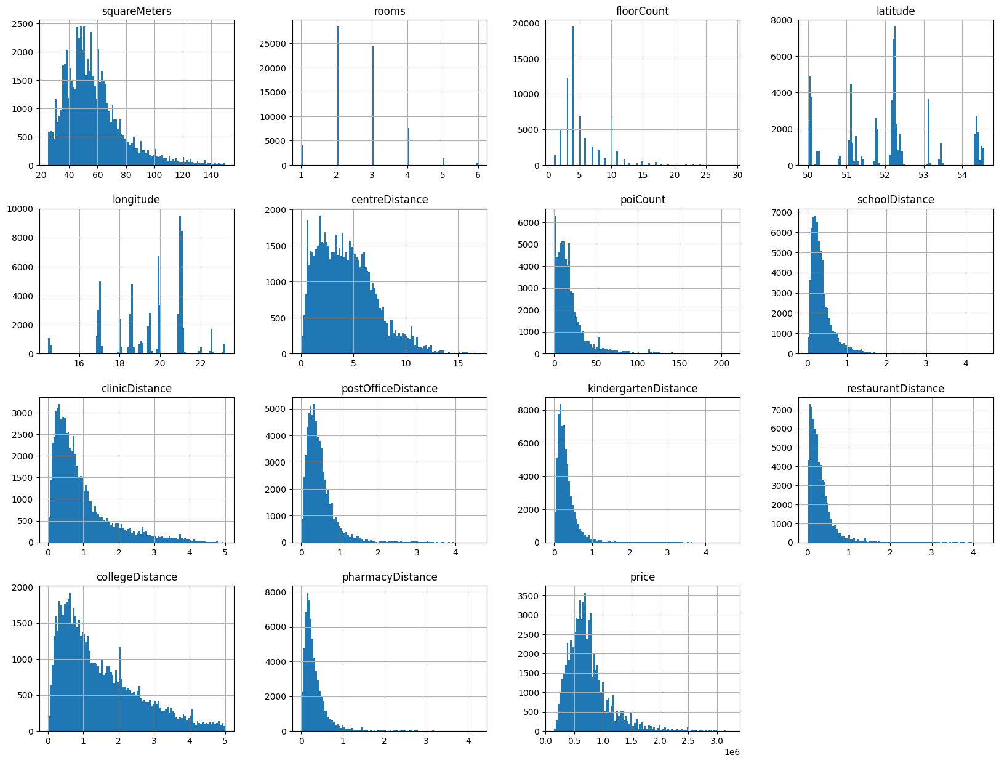

In [7]:
"""
Histograms.
"""

%matplotlib inline
data.hist(bins=100, figsize=(20,15))
plt.show()

In [8]:
"""
Locations on map.
This kind of map is loading quite long, but I think its worth it.
"""

locations = list(zip(data['latitude'], data['longitude']))
m = folium.Map(
    location=[np.mean(data['latitude']), np.mean(data['longitude'])],
    zoom_start=6
)
 
marker_cluster = MarkerCluster(locations=locations)
marker_cluster.add_to(m)
m

In [63]:
"""
Locations based on price.
"""

cities = np.unique(data['city'])
norm = Normalize(vmin=0, vmax=3.25e6)

for city in cities:
    subset = data[data['city'] == city]
    subset.plot(
        kind='scatter',
        x='longitude',
        y='latitude',
        title=city,
        alpha=0.5,
        s=subset['price'] / 10000,
        figsize=(10, 7),
        c='price',
        norm=norm,
        cmap=plt.get_cmap('jet'),
        colorbar=True
    )

KeyError: 'city'

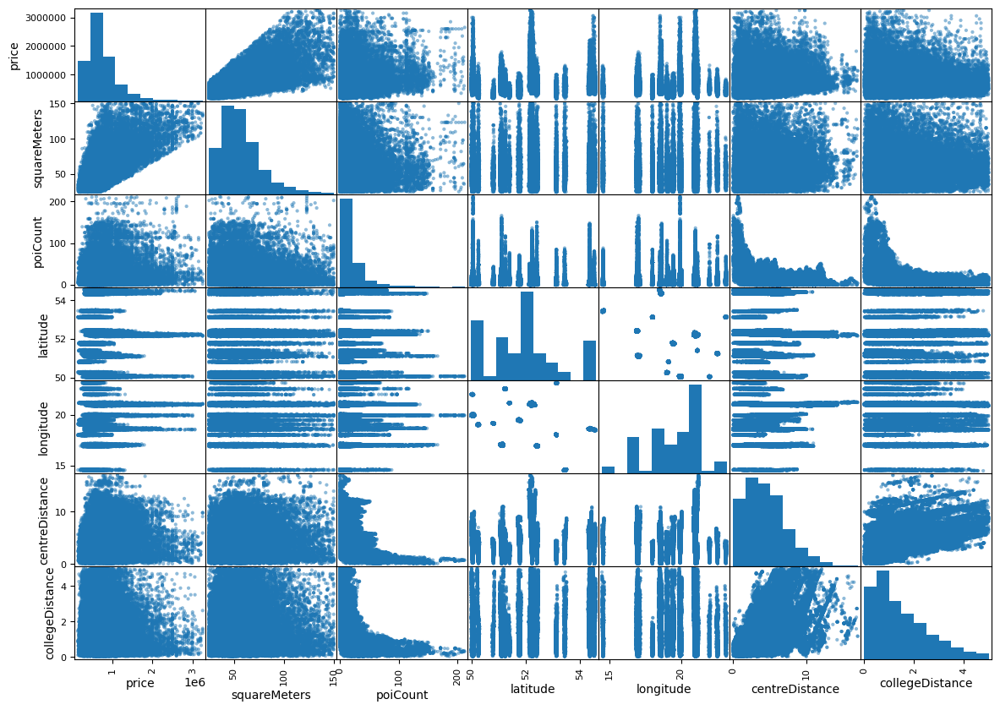

In [10]:
"""
Corelation matrix.
"""

%matplotlib inline
from pandas.plotting import scatter_matrix

attributes = ['price', 'squareMeters', 'poiCount', 'latitude', 'longitude', 'centreDistance', 'collegeDistance']
scatter_matrix(data[attributes], figsize=(14,10))
plt.show()

<AxesSubplot:>

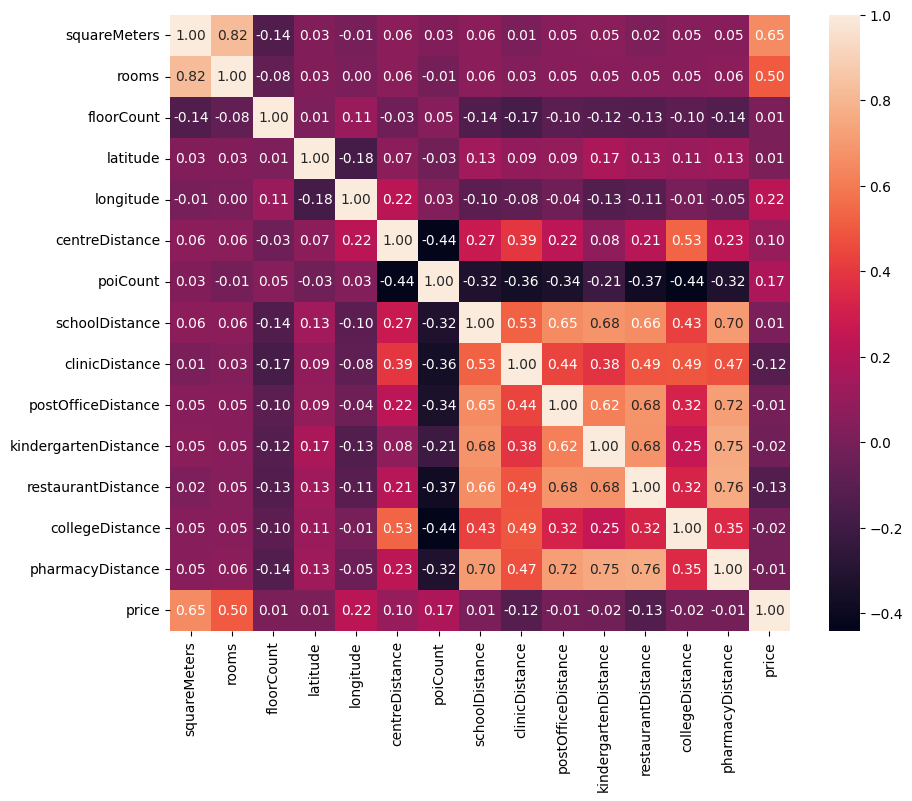

In [11]:
"""
Heatmap.
"""

plt.figure(figsize=(10, 8))
sns.heatmap(data.corr(numeric_only=True), annot=True, fmt = '.2f')

### 4. Split and build data

In [62]:
"""
One-hot coding for cities.
"""

city_dummies = pd.get_dummies(data['city'])
data = data.drop('city', axis=1)
data = pd.concat([data, city_dummies], axis=1)

KeyError: 'city'

In [61]:
"""
Normalization and exclude numerical columns.
"""

scaler = MinMaxScaler()
numerical_columns = data.select_dtypes(include=['number']).columns
data[numerical_columns] = scaler.fit_transform(data[numerical_columns])
data = data[numerical_columns]

In [14]:
"""
Split data to train and test.
"""

test_ratio = 0.1 # 10% of amount is test data
y = data['price']
X = data.drop(columns=['price'])
rand_val = random.randint(0, 111)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_ratio, random_state=rand_val)

print(f"Training set amount: {len(X_train)}\nTest set amount: {len(X_test)}")



Training set amount: 59798
Test set amount: 6645


In [15]:
"""
Check columns and data example.
"""

X_train.head()

,squareMeters,rooms,floorCount,latitude,longitude,centreDistance,poiCount,schoolDistance,clinicDistance,postOfficeDistance,...,katowice,krakow,lodz,lublin,poznan,radom,rzeszow,szczecin,warszawa,wroclaw
23687,0.2288,0.4,0.107143,0.996172,0.461747,0.262411,0.000000,0.529754,0.535721,0.491492,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
40295,0.2800,0.4,0.071429,0.951238,0.467822,0.386525,0.042453,0.156152,0.456674,0.097949,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
33755,0.2480,0.2,0.107143,0.246625,0.294341,0.033688,0.405660,0.030201,0.103462,0.081152,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
17756,0.0400,0.0,0.357143,0.007568,0.630968,0.306147,0.056604,0.031544,0.156894,0.048866,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
51746,0.1296,0.2,0.035714,0.982743,0.466483,0.187352,0.033019,0.163311,0.133680,0.016143,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### 5. Build models

Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best hiperparameters: {'n_estimators': 5, 'min_samples_split': 4, 'max_depth': 5, 'criterion': 'squared_error'}
Lowest MSE: -0.00

R^2 factor: 0.900


<AxesSubplot:xlabel='Actual', ylabel='Predicted'>

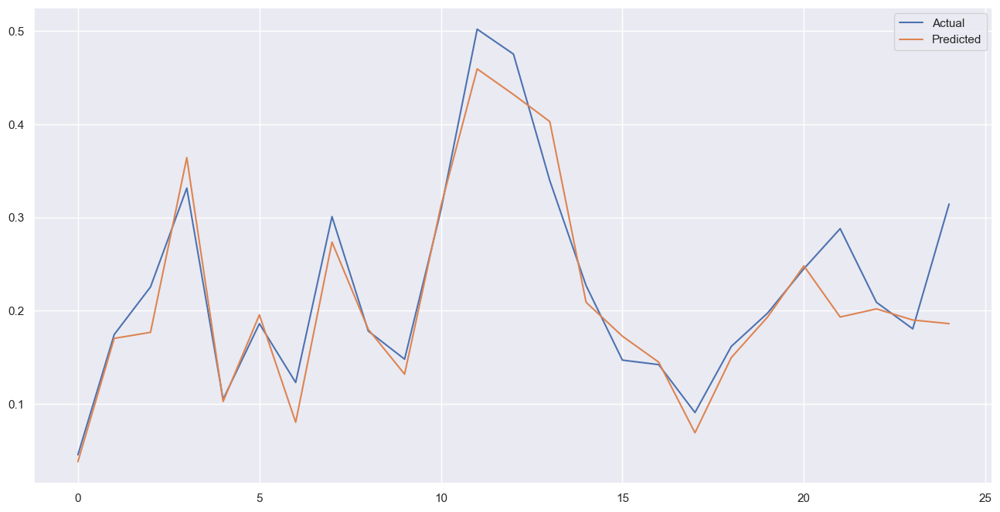

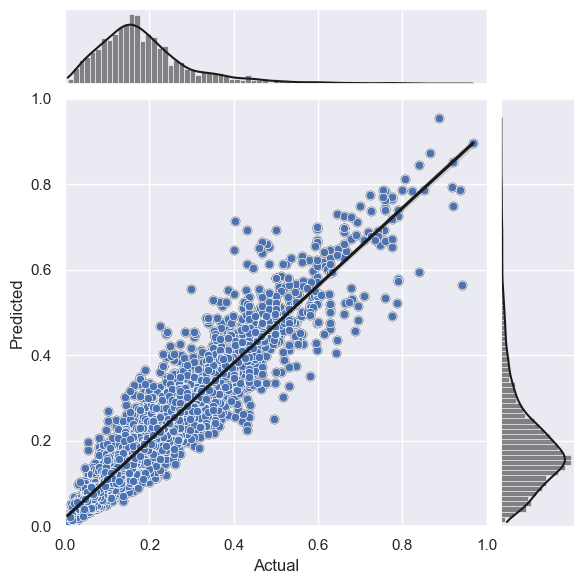

In [60]:
"""
Random forest regressor for every attribute (reg_14f)
""" 

# Find best model hiperparameters.
# parameters={
#     'max_depth':list(np.arange(5, 10, step=5)),
#     'n_estimators':np.arange(5, 10, step=5),
#     'criterion':['poisson','squared_error'],
#     'min_samples_split':np.arange(2, 10, step=2)
# }

# rf_reg = RandomForestRegressor()
# reg = RandomizedSearchCV(
#     estimator=rf_reg,
#     param_distributions=parameters,
#     n_iter=8,
#     cv=5,
#     scoring='neg_mean_squared_error',
#     n_jobs=-1,
#     verbose=2
# )
# reg.fit(X_train, y_train)
# print("Best hiperparameters: " + str(reg.best_params_))
# print("Lowest MSE: "+ "{:.2f}".format(reg.best_score_))
# reg_14f = RandomForestRegressor(**reg.best_params_)


reg_14f = RandomForestRegressor()
reg_14f.fit(X_train, y_train)
y_pred = reg_14f.predict(X_test)
print("\nR^2 factor: " + "{:.3f}".format(r2_score(y_test, y_pred)))

y_diff = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
fig = plt.figure(figsize=(16,8))
y_diff = y_diff.reset_index()
y_diff = y_diff.drop(['index'],axis=1)
plt.plot(y_diff[:25])
plt.legend(['Actual','Predicted'])
sns.set(style='darkgrid')
jplot = sns.jointplot(
    xlim=(0,1.0),
    ylim=(0, 1.0),
    x='Actual',
    y='Predicted',
    data=y_diff,
    kind='reg',
    color='k'
);
sns.scatterplot(
    data=y_diff,
    x='Actual',
    y='Predicted',
    ax=jplot.ax_joint,
)

### 6. Export model to PMML

In [66]:
from sklearn2pmml import PMMLPipeline
from sklearn2pmml import sklearn2pmml

pipeline = PMMLPipeline([("estimator", reg_14f)])
sklearn2pmml(pipeline, "reg_14f.pmml", with_repr=True)